# Car Insurance Prediction
In this notebook, we train and deploy a ML model to predict whether or not an individual is likely to purchase car insurance. The data used will be from the following dataset: https://www.kaggle.com/kondla/carinsurance  
 
In the first section of this notebook we will perform EDA, preprocessing and some feature engineering in order to prepare the data for modelling.
In the modelling segment, we will use Grid Search Cross Validation to find the optimal parameters to train an XGBoost model, to predict whether a person will purchase car insurance or not.

In the final segment of the notebook, we can make a call to the Flask API serving the persisted trained model, in order to make a prediction on a sample from the test set.

# EDA and Data pre-processing:

In [5]:
import datetime
import json
import joblib
import pandas as pd
import numpy as np
import requests
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import plot_roc_curve
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
import xgboost as xgb
%matplotlib inline

df = pd.read_csv("./carInsurance_train.csv",index_col=0)
df.head(570)



,Age,Job,Marital,Education,Default,Balance,HHInsurance,CarLoan,Communication,LastContactDay,LastContactMonth,NoOfContacts,DaysPassed,PrevAttempts,Outcome,CallStart,CallEnd,CarInsurance
Id,,,,,,,,,,,,,,,,,,
1,32,management,single,tertiary,0,1218,1,0,telephone,28,jan,2,-1,0,NaN,13:45:20,13:46:30,0
2,32,blue-collar,married,primary,0,1156,1,0,NaN,26,may,5,-1,0,NaN,14:49:03,14:52:08,0
3,29,management,single,tertiary,0,637,1,0,cellular,3,jun,1,119,1,failure,16:30:24,16:36:04,1
4,25,student,single,primary,0,373,1,0,cellular,11,may,2,-1,0,NaN,12:06:43,12:20:22,1
5,30,management,married,tertiary,0,2694,0,0,cellular,3,jun,1,-1,0,NaN,14:35:44,14:38:56,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
566,44,management,single,secondary,0,-228,1,1,cellular,13,may,1,362,2,failure,10:26:28,10:27:06,0
567,39,blue-collar,married,primary,0,1742,0,0,NaN,9,jul,6,-1,0,NaN,15:51:37,15:53:47,0
568,57,admin.,married,secondary,0,169,0,0,cellular,3,feb,1,-1,0,NaN,14:52:10,14:58:19,1


  0%|                                                                                          | 0/698 [00:00<…


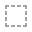
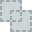
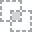
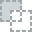
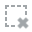
...
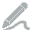
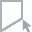
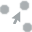
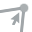
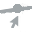

In [6]:
from dataprep.eda import plot
plot(df)

Check which are categorical:

In [7]:
df_category_subset = df.select_dtypes(include='object')

df.select_dtypes(include='object')

,Job,Marital,Education,Communication,LastContactMonth,Outcome,CallStart,CallEnd
Id,,,,,,,,
1,management,single,tertiary,telephone,jan,<NA>,13:45:20,13:46:30
2,blue-collar,married,primary,<NA>,may,<NA>,14:49:03,14:52:08
3,management,single,tertiary,cellular,jun,failure,16:30:24,16:36:04
4,student,single,primary,cellular,may,<NA>,12:06:43,12:20:22
5,management,married,tertiary,cellular,jun,<NA>,14:35:44,14:38:56
...,...,...,...,...,...,...,...,...
3996,technician,single,tertiary,cellular,may,failure,17:46:28,17:50:57
3997,admin.,divorced,secondary,cellular,jul,NaN,14:49:16,14:51:21
3998,admin.,single,secondary,cellular,jul,NaN,12:19:03,12:23:53


All categorical variables above appear to be nominal - ie there does not seem to be any ordering to them in terms of scale. An exception is 'education', which could be viewed as an ordinal categorical variable (primary education comes before secondary, then tertiary).

In [8]:
# Create a mapper for education 

scale_mapper = {
    "primary": 0,
    "secondary": 1,
    "tertiary": 2,
}

df['Education'] = df['Education'].replace(scale_mapper)

df.head()

,Age,Job,Marital,Education,Default,Balance,HHInsurance,CarLoan,Communication,LastContactDay,LastContactMonth,NoOfContacts,DaysPassed,PrevAttempts,Outcome,CallStart,CallEnd,CarInsurance
Id,,,,,,,,,,,,,,,,,,
1,32,management,single,2,0,1218,1,0,telephone,28,jan,2,-1,0,<NA>,13:45:20,13:46:30,0
2,32,blue-collar,married,0,0,1156,1,0,<NA>,26,may,5,-1,0,<NA>,14:49:03,14:52:08,0
3,29,management,single,2,0,637,1,0,cellular,3,jun,1,119,1,failure,16:30:24,16:36:04,1
4,25,student,single,0,0,373,1,0,cellular,11,may,2,-1,0,<NA>,12:06:43,12:20:22,1
5,30,management,married,2,0,2694,0,0,cellular,3,jun,1,-1,0,<NA>,14:35:44,14:38:56,0


In [9]:
# Use median to impute:
df['Education'].fillna(df['Education'].median(), inplace=True)

In [10]:
df.head()

,Age,Job,Marital,Education,Default,Balance,HHInsurance,CarLoan,Communication,LastContactDay,LastContactMonth,NoOfContacts,DaysPassed,PrevAttempts,Outcome,CallStart,CallEnd,CarInsurance
Id,,,,,,,,,,,,,,,,,,
1,32,management,single,2.0,0,1218,1,0,telephone,28,jan,2,-1,0,<NA>,13:45:20,13:46:30,0
2,32,blue-collar,married,0.0,0,1156,1,0,<NA>,26,may,5,-1,0,<NA>,14:49:03,14:52:08,0
3,29,management,single,2.0,0,637,1,0,cellular,3,jun,1,119,1,failure,16:30:24,16:36:04,1
4,25,student,single,0.0,0,373,1,0,cellular,11,may,2,-1,0,<NA>,12:06:43,12:20:22,1
5,30,management,married,2.0,0,2694,0,0,cellular,3,jun,1,-1,0,<NA>,14:35:44,14:38:56,0


In [11]:
df.isna().sum()

Age                    0
Job                   19
Marital                0
Education              0
Default                0
Balance                0
HHInsurance            0
CarLoan                0
Communication        902
LastContactDay         0
LastContactMonth       0
NoOfContacts           0
DaysPassed             0
PrevAttempts           0
Outcome             3042
CallStart              0
CallEnd                0
CarInsurance           0
dtype: int64

In [12]:
# first one-hot encode the categorical columns which have NaNs

df = pd.get_dummies(df, columns=['Job', 'Communication', 'Outcome'], 
                        dummy_na=True, 
                        drop_first=False)
df.head()

,Age,Marital,Education,Default,Balance,HHInsurance,CarLoan,LastContactDay,LastContactMonth,NoOfContacts,...,Job_technician,Job_unemployed,Job_nan,Communication_cellular,Communication_telephone,Communication_nan,Outcome_failure,Outcome_other,Outcome_success,Outcome_nan
Id,,,,,,,,,,,,,,,,,,,,,
1,32,single,2.0,0,1218,1,0,28,jan,2,...,0,0,0,0,1,0,0,0,0,1
2,32,married,0.0,0,1156,1,0,26,may,5,...,0,0,0,0,0,1,0,0,0,1
3,29,single,2.0,0,637,1,0,3,jun,1,...,0,0,0,1,0,0,1,0,0,0
4,25,single,0.0,0,373,1,0,11,may,2,...,0,0,0,1,0,0,0,0,0,1
5,30,married,2.0,0,2694,0,0,3,jun,1,...,0,0,0,1,0,0,0,0,0,1


In [13]:
%%time
# convert time features to two new features = call duration, and morning,afternoon,evening bins => Period_of_day_call

start_secs=[]
for time in df['CallStart']:
    td = pd.Timedelta(time)
    time = td.seconds
    start_secs.append(time)
    
end_secs=[]
for time in df['CallEnd']:
    td = pd.Timedelta(time)
    time = td.seconds
    end_secs.append(time)
    

call_duration=[]
for start,end in zip(pd.Series(start_secs), pd.Series(end_secs)):
    duration = end-start
    call_duration.append(duration)
    
df['Call_duration'] = call_duration
df['Start_call_secs'] = start_secs

Wall time: 81.8 ms


In [14]:
df.head()

,Age,Marital,Education,Default,Balance,HHInsurance,CarLoan,LastContactDay,LastContactMonth,NoOfContacts,...,Job_nan,Communication_cellular,Communication_telephone,Communication_nan,Outcome_failure,Outcome_other,Outcome_success,Outcome_nan,Call_duration,Start_call_secs
Id,,,,,,,,,,,,,,,,,,,,,
1,32,single,2.0,0,1218,1,0,28,jan,2,...,0,0,1,0,0,0,0,1,70,49520
2,32,married,0.0,0,1156,1,0,26,may,5,...,0,0,0,1,0,0,0,1,185,53343
3,29,single,2.0,0,637,1,0,3,jun,1,...,0,1,0,0,1,0,0,0,340,59424
4,25,single,0.0,0,373,1,0,11,may,2,...,0,1,0,0,0,0,0,1,819,43603
5,30,married,2.0,0,2694,0,0,3,jun,1,...,0,1,0,0,0,0,0,1,192,52544


In [15]:
time=df['Start_call_secs']

period_of_day_call = []

for call_time in time:                                                         # 6 potential bins
    if pd.Timedelta('6:00:00').seconds < call_time <= pd.Timedelta('09:00:00').seconds:
        period_of_day_call.append('6am-9am')
    elif pd.Timedelta('9:00:00').seconds < call_time <= pd.Timedelta('12:00:00').seconds:
        period_of_day_call.append('9am-12am')
    elif pd.Timedelta('12:00:00').seconds < call_time <= pd.Timedelta('15:00:00').seconds:
        period_of_day_call.append('12am-3pm')
    elif pd.Timedelta('15:00:00').seconds < call_time <= pd.Timedelta('18:00:00').seconds:
        period_of_day_call.append('3pm-6pm')
    elif pd.Timedelta('18:00:00').seconds < call_time <= pd.Timedelta('21:00:00').seconds:
        period_of_day_call.append('6pm-9pm')
    elif pd.Timedelta('21:00:00').seconds < call_time <= pd.Timedelta('23:59:00').seconds:
        period_of_day_call.append('9pm-12pm')

df['Period_of_day_call'] = period_of_day_call

df = df.drop(columns=['CallStart', 'CallEnd', 'Start_call_secs'])


In [16]:
df.head(50)

,Age,Marital,Education,Default,Balance,HHInsurance,CarLoan,LastContactDay,LastContactMonth,NoOfContacts,...,Job_nan,Communication_cellular,Communication_telephone,Communication_nan,Outcome_failure,Outcome_other,Outcome_success,Outcome_nan,Call_duration,Period_of_day_call
Id,,,,,,,,,,,,,,,,,,,,,
1,32,single,2.0,0,1218,1,0,28,jan,2,...,0,0,1,0,0,0,0,1,70,12am-3pm
2,32,married,0.0,0,1156,1,0,26,may,5,...,0,0,0,1,0,0,0,1,185,12am-3pm
3,29,single,2.0,0,637,1,0,3,jun,1,...,0,1,0,0,1,0,0,0,340,3pm-6pm
4,25,single,0.0,0,373,1,0,11,may,2,...,0,1,0,0,0,0,0,1,819,12am-3pm
5,30,married,2.0,0,2694,0,0,3,jun,1,...,0,1,0,0,0,0,0,1,192,12am-3pm
6,32,single,2.0,0,1625,0,0,22,may,1,...,0,1,0,0,1,0,0,0,796,12am-3pm
7,37,single,2.0,0,1000,1,0,17,mar,1,...,0,1,0,0,0,0,0,1,195,12am-3pm
8,35,divorced,2.0,0,538,1,0,12,may,4,...,0,0,0,1,0,0,0,1,66,3pm-6pm
9,30,married,1.0,0,187,1,0,18,nov,1,...,0,1,0,0,0,0,0,1,106,12am-3pm


In [17]:
# now one-hot encode all other categorical columns
pd.set_option('display.max_columns', 500)
df = pd.get_dummies(df, drop_first=False)
df.head(570)

,Age,Education,Default,Balance,HHInsurance,CarLoan,LastContactDay,NoOfContacts,DaysPassed,PrevAttempts,CarInsurance,Job_admin.,Job_blue-collar,Job_entrepreneur,Job_housemaid,Job_management,Job_retired,Job_self-employed,Job_services,Job_student,Job_technician,Job_unemployed,Job_nan,Communication_cellular,Communication_telephone,Communication_nan,Outcome_failure,Outcome_other,Outcome_success,Outcome_nan,Call_duration,Marital_divorced,Marital_married,Marital_single,LastContactMonth_apr,LastContactMonth_aug,LastContactMonth_dec,LastContactMonth_feb,LastContactMonth_jan,LastContactMonth_jul,LastContactMonth_jun,LastContactMonth_mar,LastContactMonth_may,LastContactMonth_nov,LastContactMonth_oct,LastContactMonth_sep,Period_of_day_call_12am-3pm,Period_of_day_call_3pm-6pm,Period_of_day_call_6am-9am,Period_of_day_call_9am-12am
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,32,2.0,0,1218,1,0,28,2,-1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,70,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0
2,32,0.0,0,1156,1,0,26,5,-1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,185,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0
3,29,2.0,0,637,1,0,3,1,119,1,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,340,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0
4,25,0.0,0,373,1,0,11,2,-1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,819,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0
5,30,2.0,0,2694,0,0,3,1,-1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,192,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
566,44,1.0,0,-228,1,1,13,1,362,2,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,38,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1
567,39,0.0,0,1742,0,0,9,6,-1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,130,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0
568,57,1.0,0,169,0,0,3,1,-1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,369,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0


In [18]:
# Find the number of nulls/NaNs remaining in the dataset

df.isna().sum()

Age                            0
Education                      0
Default                        0
Balance                        0
HHInsurance                    0
CarLoan                        0
LastContactDay                 0
NoOfContacts                   0
DaysPassed                     0
PrevAttempts                   0
CarInsurance                   0
Job_admin.                     0
Job_blue-collar                0
Job_entrepreneur               0
Job_housemaid                  0
Job_management                 0
Job_retired                    0
Job_self-employed              0
Job_services                   0
Job_student                    0
Job_technician                 0
Job_unemployed                 0
Job_nan                        0
Communication_cellular         0
Communication_telephone        0
Communication_nan              0
Outcome_failure                0
Outcome_other                  0
Outcome_success                0
Outcome_nan                    0
Call_durat

  0%|                                                                                         | 0/1570 [00:00<…


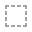
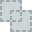
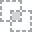
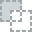
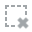
...
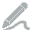
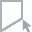
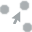
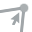
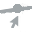

In [19]:
plot(df)

In [ ]:
# zero nans left

In [ ]:
### normally would have to handle outliers, but xgboost can handle outliers and scaling

# Modelling:

Experiment to find the optimal hyperparameters for XGBoost - Run 5-fold Grid Search CV: 

In [ ]:
y = df['CarInsurance']
X = df.drop(columns=['CarInsurance'])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42) # keep random_state constant for reproducibility
model = xgb.XGBClassifier()


param_grid={'n_estimators':[1000,2000,2500,3500],
            'max_depth':[4,8,12,16],
            'min_child_weight':[1,3,6],
            'subsample':[0.2, 0.4, 0.8],
            'colsample_bytree':[0.3,0.4,0.5],
            'learning_rate':[0.1,0.01, 0.001,0.0001, 0.3,0.03,0.003,0.0003]}

search = GridSearchCV(model, param_grid, n_jobs=-1,scoring="accuracy",
                      cv=5, refit=True, verbose=2)

search.fit(X_train, y_train)
print('\n Best Parameters Found:')
print(search.best_params_)
print('\n Best Model Found:')
best_model = search.best_estimator_
print(best_model)

Fitting 5 folds for each of 3456 candidates, totalling 17280 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:   20.2s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 349 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 632 tasks      | elapsed: 11.0min
[Parallel(n_jobs=-1)]: Done 997 tasks      | elapsed: 17.2min
[Parallel(n_jobs=-1)]: Done 1442 tasks      | elapsed: 28.0min
[Parallel(n_jobs=-1)]: Done 1969 tasks      | elapsed: 38.9min
[Parallel(n_jobs=-1)]: Done 2576 tasks      | elapsed: 52.5min
[Parallel(n_jobs=-1)]: Done 3265 tasks      | elapsed: 65.9min
[Parallel(n_jobs=-1)]: Done 4034 tasks      | elapsed: 79.0min
[Parallel(n_jobs=-1)]: Done 4885 tasks      | elapsed: 97.1min
[Parallel(n_jobs=-1)]: Done 5816 tasks      | elapsed: 118.9min
[Parallel(n_jobs=-1)]: Done 6829 tasks      | elapsed: 139.9min
[Parallel(n_jobs=-1)]: Done 7922 tasks      | elapsed: 172.1min
[Parallel(n_jobs=-1)]: Done 9097 tasks      


 Best Parameters Found:
{'colsample_bytree': 0.3, 'learning_rate': 0.01, 'max_depth': 4, 'min_child_weight': 1, 'n_estimators': 2000, 'subsample': 0.8}

 Best Model Found:
XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.3, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.01, max_delta_step=0, max_depth=4,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=2000, n_jobs=0, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=0.8,
              tree_method='exact', validate_parameters=1, verbosity=None)


Retrain with the optimal parameters to save a model that will work with serving via Flask:

In [22]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


params = {'colsample_bytree': 0.3, 'learning_rate': 0.01, 'max_depth': 4, 'min_child_weight': 1, 'n_estimators': 2000, 'subsample': 0.8}
model = xgb.XGBClassifier(**params)
model.fit(
X_train, y_train)


C:\Users\Mark\Documents\anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:28:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.3, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.01, max_delta_step=0, max_depth=4,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=2000, n_jobs=4, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=0.8,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [38]:
filename = 'tuned_model.sav'
joblib.dump(model, filename)
print('saved best_model')

saved best_model


In [23]:
pred = model.predict(X_test)
print(classification_report(y_test, pred,))

              precision    recall  f1-score   support

           0       0.87      0.87      0.87       484
           1       0.80      0.81      0.80       316

    accuracy                           0.84       800
   macro avg       0.84      0.84      0.84       800
weighted avg       0.84      0.84      0.84       800



In [24]:
score = accuracy_score(y_test, pred)
print('Accuracy: %.3f' % score)

Accuracy: 0.844


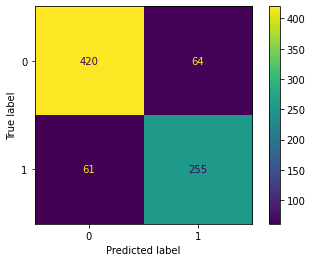

In [25]:
plot_confusion_matrix(model, X_test, y_test)  
plt.show()  

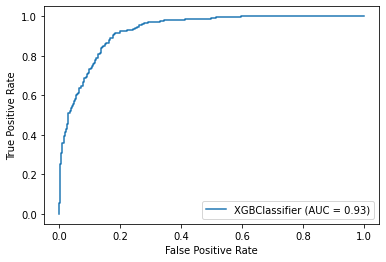

In [26]:
plot_roc_curve(model, X_test, y_test)
plt.show()

We can inspect this model and parameter set more to see if any overfitting takes place, with learning curves:

In [27]:
params = {'colsample_bytree': 0.3, 'learning_rate': 0.01, 'max_depth': 4, 'min_child_weight': 1, 'n_estimators': 2000, 'subsample': 0.8}

model = xgb.XGBClassifier(**params)
evalset = [(X_train, y_train), (X_test,y_test)]
model.fit(
X_train, y_train, eval_metric='logloss', eval_set=evalset, early_stopping_rounds=100, verbose=2)


[0]	validation_0-logloss:0.69160	validation_1-logloss:0.69179
[2]	validation_0-logloss:0.68871	validation_1-logloss:0.68905
[4]	validation_0-logloss:0.68355	validation_1-logloss:0.68384
[6]	validation_0-logloss:0.67850	validation_1-logloss:0.67913
[8]	validation_0-logloss:0.67318	validation_1-logloss:0.67417
[10]	validation_0-logloss:0.67036	validation_1-logloss:0.67150
[12]	validation_0-logloss:0.66514	validation_1-logloss:0.66672


C:\Users\Mark\Documents\anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14]	validation_0-logloss:0.66204	validation_1-logloss:0.66375
[16]	validation_0-logloss:0.65930	validation_1-logloss:0.66109
[18]	validation_0-logloss:0.65685	validation_1-logloss:0.65892
[20]	validation_0-logloss:0.65397	validation_1-logloss:0.65610
[22]	validation_0-logloss:0.64973	validation_1-logloss:0.65208
[24]	validation_0-logloss:0.64729	validation_1-logloss:0.64986
[26]	validation_0-logloss:0.64463	validation_1-logloss:0.64746
[28]	validation_0-logloss:0.64248	validation_1-logloss:0.64561
[30]	validation_0-logloss:0.63794	validation_1-logloss:0.64110
[32]	validation_0-logloss:0.63137	validation_1-logloss:0.63479
[34]	validation_0-logloss:0.62713	validation_1-logloss:0.63096
[36]	validation_0-logloss:0.62506	validation_1-logloss:0.62928
[38]	validation_0-logloss:0.62301	validation_1-logloss:0.62728
[40]	validation_0-logloss:0.62116	validation_1-logloss:0.62553
[42]	validation_0-logloss:0.61941	validation_1-logloss:0.62397
[44]	validation_0-logloss:0.61540	validation_1-logloss:

[272]	validation_0-logloss:0.42704	validation_1-logloss:0.44614
[274]	validation_0-logloss:0.42674	validation_1-logloss:0.44593
[276]	validation_0-logloss:0.42637	validation_1-logloss:0.44575
[278]	validation_0-logloss:0.42601	validation_1-logloss:0.44554
[280]	validation_0-logloss:0.42487	validation_1-logloss:0.44456
[282]	validation_0-logloss:0.42455	validation_1-logloss:0.44426
[284]	validation_0-logloss:0.42415	validation_1-logloss:0.44396
[286]	validation_0-logloss:0.42386	validation_1-logloss:0.44370
[288]	validation_0-logloss:0.42261	validation_1-logloss:0.44262
[290]	validation_0-logloss:0.42227	validation_1-logloss:0.44237
[292]	validation_0-logloss:0.42114	validation_1-logloss:0.44143
[294]	validation_0-logloss:0.42085	validation_1-logloss:0.44114
[296]	validation_0-logloss:0.42049	validation_1-logloss:0.44080
[298]	validation_0-logloss:0.42013	validation_1-logloss:0.44048
[300]	validation_0-logloss:0.41824	validation_1-logloss:0.43858
[302]	validation_0-logloss:0.41718	valid

[530]	validation_0-logloss:0.35298	validation_1-logloss:0.38679
[532]	validation_0-logloss:0.35277	validation_1-logloss:0.38667
[534]	validation_0-logloss:0.35255	validation_1-logloss:0.38660
[536]	validation_0-logloss:0.35240	validation_1-logloss:0.38648
[538]	validation_0-logloss:0.35218	validation_1-logloss:0.38632
[540]	validation_0-logloss:0.35193	validation_1-logloss:0.38626
[542]	validation_0-logloss:0.35128	validation_1-logloss:0.38579
[544]	validation_0-logloss:0.35102	validation_1-logloss:0.38559
[546]	validation_0-logloss:0.35053	validation_1-logloss:0.38515
[548]	validation_0-logloss:0.34988	validation_1-logloss:0.38464
[550]	validation_0-logloss:0.34931	validation_1-logloss:0.38416
[552]	validation_0-logloss:0.34848	validation_1-logloss:0.38344
[554]	validation_0-logloss:0.34788	validation_1-logloss:0.38285
[556]	validation_0-logloss:0.34727	validation_1-logloss:0.38238
[558]	validation_0-logloss:0.34705	validation_1-logloss:0.38219
[560]	validation_0-logloss:0.34685	valid

[788]	validation_0-logloss:0.31049	validation_1-logloss:0.35848
[790]	validation_0-logloss:0.31035	validation_1-logloss:0.35842
[792]	validation_0-logloss:0.31016	validation_1-logloss:0.35830
[794]	validation_0-logloss:0.31005	validation_1-logloss:0.35826
[796]	validation_0-logloss:0.30979	validation_1-logloss:0.35805
[798]	validation_0-logloss:0.30950	validation_1-logloss:0.35787
[800]	validation_0-logloss:0.30921	validation_1-logloss:0.35762
[802]	validation_0-logloss:0.30907	validation_1-logloss:0.35753
[804]	validation_0-logloss:0.30878	validation_1-logloss:0.35735
[806]	validation_0-logloss:0.30863	validation_1-logloss:0.35727
[808]	validation_0-logloss:0.30849	validation_1-logloss:0.35724
[810]	validation_0-logloss:0.30833	validation_1-logloss:0.35722
[812]	validation_0-logloss:0.30809	validation_1-logloss:0.35699
[814]	validation_0-logloss:0.30786	validation_1-logloss:0.35695
[816]	validation_0-logloss:0.30759	validation_1-logloss:0.35682
[818]	validation_0-logloss:0.30727	valid

[1044]	validation_0-logloss:0.28512	validation_1-logloss:0.34591
[1046]	validation_0-logloss:0.28482	validation_1-logloss:0.34578
[1048]	validation_0-logloss:0.28468	validation_1-logloss:0.34572
[1050]	validation_0-logloss:0.28446	validation_1-logloss:0.34565
[1052]	validation_0-logloss:0.28430	validation_1-logloss:0.34553
[1054]	validation_0-logloss:0.28414	validation_1-logloss:0.34544
[1056]	validation_0-logloss:0.28386	validation_1-logloss:0.34530
[1058]	validation_0-logloss:0.28373	validation_1-logloss:0.34524
[1060]	validation_0-logloss:0.28349	validation_1-logloss:0.34507
[1062]	validation_0-logloss:0.28330	validation_1-logloss:0.34497
[1064]	validation_0-logloss:0.28308	validation_1-logloss:0.34480
[1066]	validation_0-logloss:0.28290	validation_1-logloss:0.34474
[1068]	validation_0-logloss:0.28278	validation_1-logloss:0.34469
[1070]	validation_0-logloss:0.28255	validation_1-logloss:0.34454
[1072]	validation_0-logloss:0.28236	validation_1-logloss:0.34451
[1074]	validation_0-loglo

[1298]	validation_0-logloss:0.26493	validation_1-logloss:0.33867
[1300]	validation_0-logloss:0.26479	validation_1-logloss:0.33857
[1302]	validation_0-logloss:0.26468	validation_1-logloss:0.33855
[1304]	validation_0-logloss:0.26456	validation_1-logloss:0.33849
[1306]	validation_0-logloss:0.26446	validation_1-logloss:0.33849
[1308]	validation_0-logloss:0.26431	validation_1-logloss:0.33848
[1310]	validation_0-logloss:0.26421	validation_1-logloss:0.33853
[1312]	validation_0-logloss:0.26405	validation_1-logloss:0.33842
[1314]	validation_0-logloss:0.26388	validation_1-logloss:0.33851
[1316]	validation_0-logloss:0.26368	validation_1-logloss:0.33840
[1318]	validation_0-logloss:0.26348	validation_1-logloss:0.33843
[1320]	validation_0-logloss:0.26333	validation_1-logloss:0.33836
[1322]	validation_0-logloss:0.26324	validation_1-logloss:0.33833
[1324]	validation_0-logloss:0.26316	validation_1-logloss:0.33829
[1326]	validation_0-logloss:0.26306	validation_1-logloss:0.33824
[1328]	validation_0-loglo

[1552]	validation_0-logloss:0.24953	validation_1-logloss:0.33545
[1554]	validation_0-logloss:0.24946	validation_1-logloss:0.33539
[1556]	validation_0-logloss:0.24939	validation_1-logloss:0.33542
[1558]	validation_0-logloss:0.24932	validation_1-logloss:0.33533
[1560]	validation_0-logloss:0.24924	validation_1-logloss:0.33525
[1562]	validation_0-logloss:0.24914	validation_1-logloss:0.33520
[1564]	validation_0-logloss:0.24909	validation_1-logloss:0.33518
[1566]	validation_0-logloss:0.24891	validation_1-logloss:0.33509
[1568]	validation_0-logloss:0.24882	validation_1-logloss:0.33513
[1570]	validation_0-logloss:0.24873	validation_1-logloss:0.33512
[1572]	validation_0-logloss:0.24858	validation_1-logloss:0.33511
[1574]	validation_0-logloss:0.24843	validation_1-logloss:0.33504
[1576]	validation_0-logloss:0.24827	validation_1-logloss:0.33503
[1578]	validation_0-logloss:0.24818	validation_1-logloss:0.33502
[1580]	validation_0-logloss:0.24807	validation_1-logloss:0.33495
[1582]	validation_0-loglo

[1806]	validation_0-logloss:0.23683	validation_1-logloss:0.33314
[1808]	validation_0-logloss:0.23674	validation_1-logloss:0.33313
[1810]	validation_0-logloss:0.23666	validation_1-logloss:0.33318
[1812]	validation_0-logloss:0.23660	validation_1-logloss:0.33316
[1814]	validation_0-logloss:0.23651	validation_1-logloss:0.33318
[1816]	validation_0-logloss:0.23641	validation_1-logloss:0.33318
[1818]	validation_0-logloss:0.23626	validation_1-logloss:0.33315
[1820]	validation_0-logloss:0.23614	validation_1-logloss:0.33313
[1822]	validation_0-logloss:0.23602	validation_1-logloss:0.33315
[1824]	validation_0-logloss:0.23594	validation_1-logloss:0.33310
[1826]	validation_0-logloss:0.23585	validation_1-logloss:0.33312
[1828]	validation_0-logloss:0.23578	validation_1-logloss:0.33316
[1830]	validation_0-logloss:0.23569	validation_1-logloss:0.33315
[1832]	validation_0-logloss:0.23557	validation_1-logloss:0.33307
[1834]	validation_0-logloss:0.23542	validation_1-logloss:0.33308
[1836]	validation_0-loglo

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.3, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.01, max_delta_step=0, max_depth=4,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=2000, n_jobs=4, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=0.8,
              tree_method='exact', validate_parameters=1, verbosity=None)

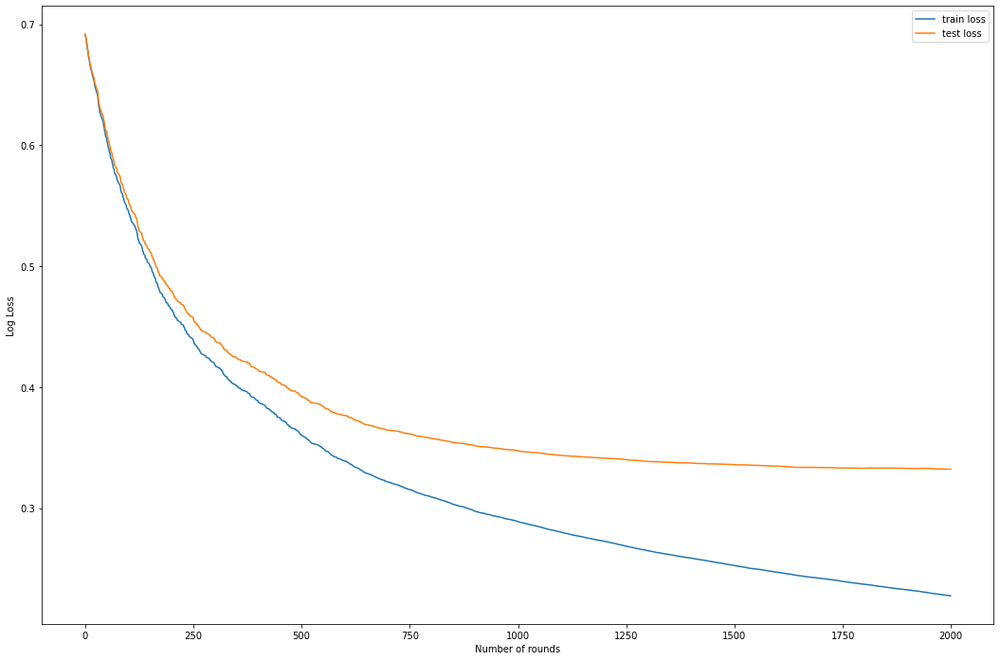

In [28]:
fig, axes = plt.subplots(figsize=(18,12))
results = model.evals_result()

plt.plot(results['validation_0']['logloss'], label='train loss')
plt.plot(results['validation_1']['logloss'], label='test loss')
plt.xlabel('Number of rounds')
plt.ylabel('Log Loss')
plt.legend()
plt.show()

This model seems suitable, and 2000 iterations seems like a good number for getting optimal reduction in test error.

# Test Deployment:

The Flask API is running via GCP Cloud Run at https://car-insurance-prediction-2hapnkm3wq-nw.a.run.app/. To make a request, take a random sample from the test set and see if the model predicts it correctly via the Flask API:

In [37]:
# use this cell to pre-process if not running notebook from beginning
import preprocess

df = pd.read_csv("./carInsurance_train.csv",index_col=0)
df = preprocess.preprocess(df)

In [38]:
y = df['CarInsurance']
X = df.drop(columns=['CarInsurance'])
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

X_test

,Age,Education,Default,Balance,HHInsurance,CarLoan,LastContactDay,NoOfContacts,DaysPassed,PrevAttempts,Job_admin.,Job_blue-collar,Job_entrepreneur,Job_housemaid,Job_management,Job_retired,Job_self-employed,Job_services,Job_student,Job_technician,Job_unemployed,Job_nan,Communication_cellular,Communication_telephone,Communication_nan,Outcome_failure,Outcome_other,Outcome_success,Outcome_nan,Call_duration,Marital_divorced,Marital_married,Marital_single,LastContactMonth_apr,LastContactMonth_aug,LastContactMonth_dec,LastContactMonth_feb,LastContactMonth_jan,LastContactMonth_jul,LastContactMonth_jun,LastContactMonth_mar,LastContactMonth_may,LastContactMonth_nov,LastContactMonth_oct,LastContactMonth_sep,Period_of_day_call_12am-3pm,Period_of_day_call_3pm-6pm,Period_of_day_call_6am-9am,Period_of_day_call_9am-12am
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
556,56,2.0,0,693,0,0,22,5,-1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,89,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0
3492,39,2.0,0,20932,0,0,21,2,-1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,127,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0
528,24,2.0,0,393,0,0,27,1,-1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1298,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0
3926,39,1.0,0,42,1,0,6,2,-1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,226,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0
2990,31,1.0,0,413,1,0,13,1,-1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,65,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1923,41,1.0,0,59,1,0,15,8,-1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,75,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0
866,42,1.0,0,19,0,0,20,4,-1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,875,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1
3944,54,2.0,1,153,0,0,9,3,-1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,99,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0


In [39]:
# Sampling random customer from test set:

def retrieve_sample_customer_from_test_set():
    sample_customer = X_test.sample()
    customer_id_number=sample_customer.index
    customer_id_number = customer_id_number[0]
    return sample_customer, customer_id_number
    
SAMPLE = True
while SAMPLE == True:
    try:
        sample_customer, customer_id_number = retrieve_sample_customer_from_test_set()
        
        print(f"Ground truth value for this customer: {y_test.iloc[customer_id_number]}")
        print(f"Customer ID: {customer_id_number}")
        break
    except:
        continue

Ground truth value for this customer: 0
Customer ID: 431


In [40]:
sample_customer = sample_customer.to_dict(orient='index') # convert to dictionary format - json readable
sample_customer

{431: {'Age': 31,
  'Education': 1.0,
  'Default': 0,
  'Balance': 33,
  'HHInsurance': 1,
  'CarLoan': 0,
  'LastContactDay': 5,
  'NoOfContacts': 2,
  'DaysPassed': -1,
  'PrevAttempts': 0,
  'Job_admin.': 1,
  'Job_blue-collar': 0,
  'Job_entrepreneur': 0,
  'Job_housemaid': 0,
  'Job_management': 0,
  'Job_retired': 0,
  'Job_self-employed': 0,
  'Job_services': 0,
  'Job_student': 0,
  'Job_technician': 0,
  'Job_unemployed': 0,
  'Job_nan': 0,
  'Communication_cellular': 1,
  'Communication_telephone': 0,
  'Communication_nan': 0,
  'Outcome_failure': 0,
  'Outcome_other': 0,
  'Outcome_success': 0,
  'Outcome_nan': 1,
  'Call_duration ': 290,
  'Marital_divorced': 0,
  'Marital_married': 1,
  'Marital_single': 0,
  'LastContactMonth_apr': 0,
  'LastContactMonth_aug': 0,
  'LastContactMonth_dec': 0,
  'LastContactMonth_feb': 0,
  'LastContactMonth_jan': 0,
  'LastContactMonth_jul': 0,
  'LastContactMonth_jun': 0,
  'LastContactMonth_mar': 0,
  'LastContactMonth_may': 1,
  'LastCo

In [41]:
sample_features = sample_customer[customer_id_number]

In [42]:
query=json.dumps(sample_features)
print(query)

{"Age": 31, "Education": 1.0, "Default": 0, "Balance": 33, "HHInsurance": 1, "CarLoan": 0, "LastContactDay": 5, "NoOfContacts": 2, "DaysPassed": -1, "PrevAttempts": 0, "Job_admin.": 1, "Job_blue-collar": 0, "Job_entrepreneur": 0, "Job_housemaid": 0, "Job_management": 0, "Job_retired": 0, "Job_self-employed": 0, "Job_services": 0, "Job_student": 0, "Job_technician": 0, "Job_unemployed": 0, "Job_nan": 0, "Communication_cellular": 1, "Communication_telephone": 0, "Communication_nan": 0, "Outcome_failure": 0, "Outcome_other": 0, "Outcome_success": 0, "Outcome_nan": 1, "Call_duration ": 290, "Marital_divorced": 0, "Marital_married": 1, "Marital_single": 0, "LastContactMonth_apr": 0, "LastContactMonth_aug": 0, "LastContactMonth_dec": 0, "LastContactMonth_feb": 0, "LastContactMonth_jan": 0, "LastContactMonth_jul": 0, "LastContactMonth_jun": 0, "LastContactMonth_mar": 0, "LastContactMonth_may": 1, "LastContactMonth_nov": 0, "LastContactMonth_oct": 0, "LastContactMonth_sep": 0, "Period_of_day_c

In [43]:
# update json query with customer id and ground truth label for reference:
# parsing JSON string:
query = json.loads(query)
  
# update the query:
id_num={"Customer_ID":int(customer_id_number)}
act_val = {"Actual":int(y_test.iloc[customer_id_number])}
query.update(id_num)
query.update(act_val)
 
# new query with CustomerID and Actual value - Note these 2 variables will not be used
# in model prediction, only for displaying at final result - they are 'popped' from the json 
# in app.py for the API service and printed on-screen
print(json.dumps(query))

{"Age": 31, "Education": 1.0, "Default": 0, "Balance": 33, "HHInsurance": 1, "CarLoan": 0, "LastContactDay": 5, "NoOfContacts": 2, "DaysPassed": -1, "PrevAttempts": 0, "Job_admin.": 1, "Job_blue-collar": 0, "Job_entrepreneur": 0, "Job_housemaid": 0, "Job_management": 0, "Job_retired": 0, "Job_self-employed": 0, "Job_services": 0, "Job_student": 0, "Job_technician": 0, "Job_unemployed": 0, "Job_nan": 0, "Communication_cellular": 1, "Communication_telephone": 0, "Communication_nan": 0, "Outcome_failure": 0, "Outcome_other": 0, "Outcome_success": 0, "Outcome_nan": 1, "Call_duration ": 290, "Marital_divorced": 0, "Marital_married": 1, "Marital_single": 0, "LastContactMonth_apr": 0, "LastContactMonth_aug": 0, "LastContactMonth_dec": 0, "LastContactMonth_feb": 0, "LastContactMonth_jan": 0, "LastContactMonth_jul": 0, "LastContactMonth_jun": 0, "LastContactMonth_mar": 0, "LastContactMonth_may": 1, "LastContactMonth_nov": 0, "LastContactMonth_oct": 0, "LastContactMonth_sep": 0, "Period_of_day_c

In [44]:
url = 'https://car-insurance-prediction-2hapnkm3wq-nw.a.run.app/'  # live url

response = requests.get(url,query) 
response.json()

{'Customer ID:': '431', 'Prediction': 0, 'Actual': '0'}

# Inspect Model feature importance - SHAP

Improve prediction explainibility with SHAP - https://shap.readthedocs.io/en/latest/index.html 

In [45]:
import shap
shap.initjs()

explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_test)

In [46]:
# single test instance prediction:
shap.force_plot(explainer.expected_value, shap_values[10], features=X_test.iloc[10], feature_names=X_test.columns, link='logit')

In [47]:
# all test instances predictions:
shap.force_plot(explainer.expected_value, shap_values, features=X_test, feature_names=X_test.columns, link='logit')

We can see from the below summary plot, that **higher call duration**, **not having HHInsurance (house insurance)** and **having Outcome_success (Outcome of the previous marketing campaign being a success)** makes this model much more likely to predict that the person **will** subscribe to car insurance. 

Regarding the **Communication** type, not knowing the type (having **Nan** as the value (**Communication_nan**)) more often led the model to predict the person as someone to **not subscribe**, while a person using **cellular (Communication_cellular)** was more often predicted by the model to be someone who **will subscribe**.

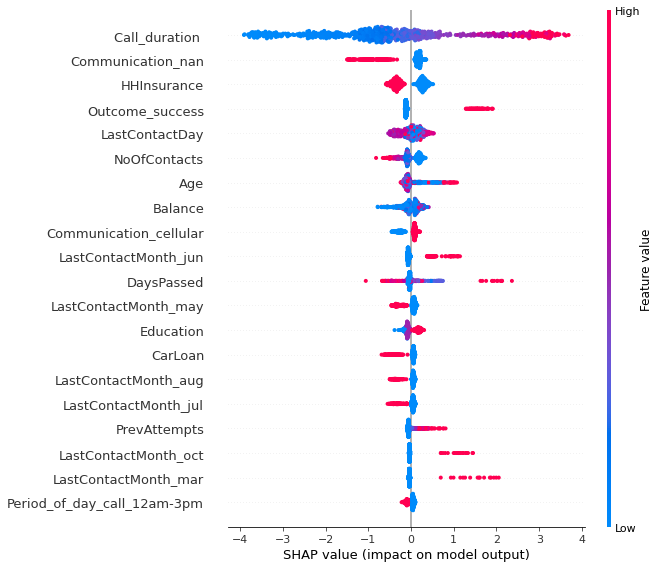

In [62]:
shap.summary_plot(shap_values, features=X_test, feature_names=X_test.columns,)

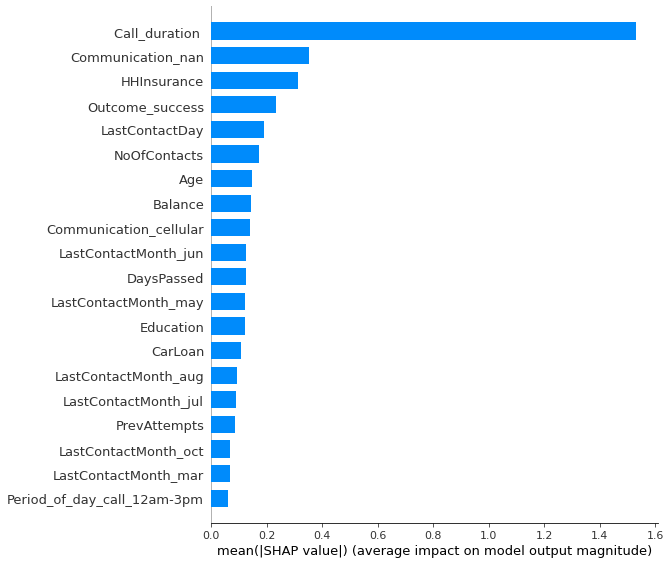

In [63]:
shap.summary_plot(shap_values, features=X_train, feature_names=X_train.columns, plot_type='bar')

Predictions of first 50 instances in test set explained, by feature impact on model prediction (Red = High amount of a feature value, blue = low amount of a feature value):

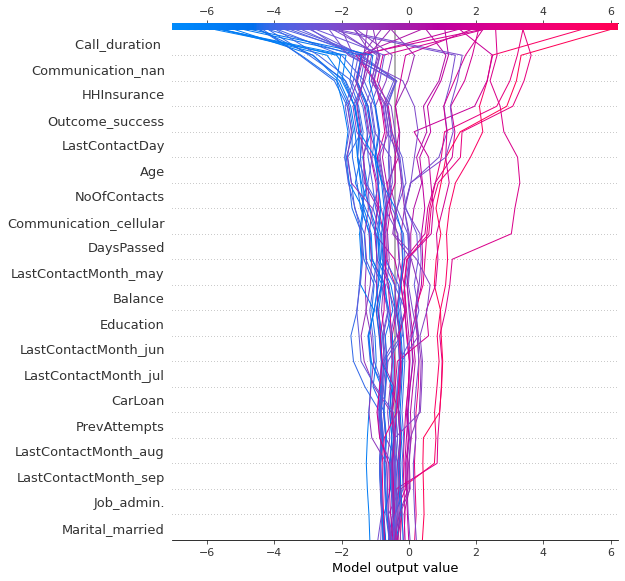

In [64]:
shap.decision_plot(explainer.expected_value, shap_values[:50], X_test[:50]) # first 50 instances in test set explained

Can rerun over all data, to get a clearer picture for some features:

In [75]:
import shap
shap.initjs()

explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X)

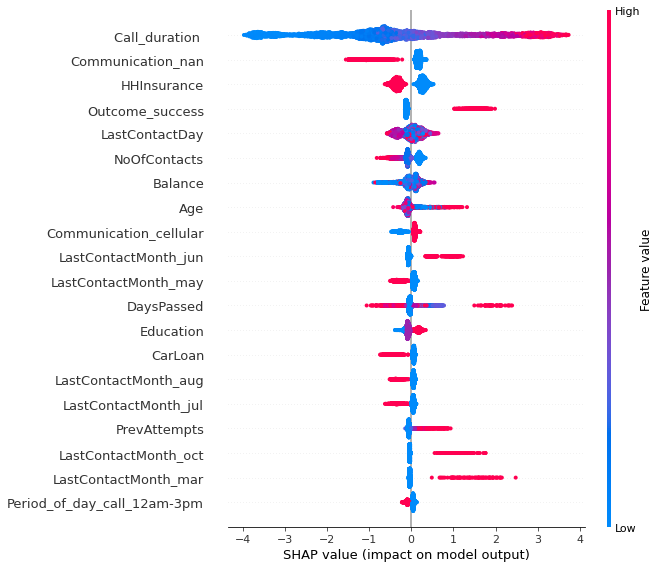

In [76]:
shap.summary_plot(shap_values, features=X, feature_names=X.columns,)

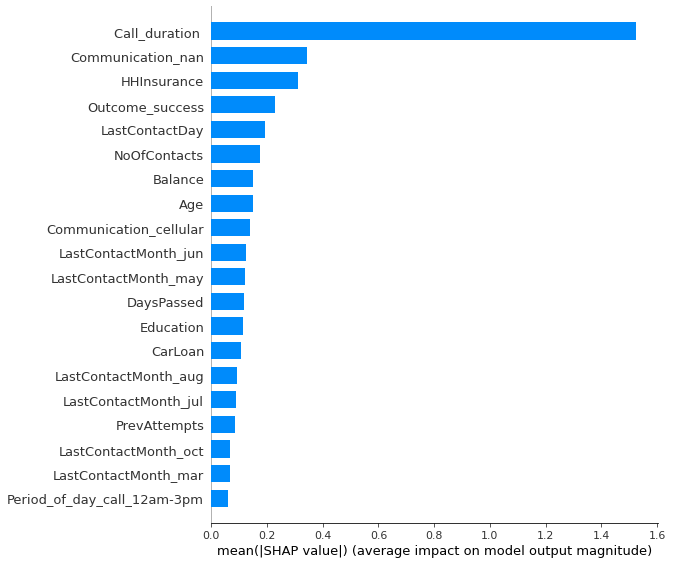

In [77]:
shap.summary_plot(shap_values, features=X, feature_names=X.columns, plot_type='bar')

 The below dependence plot for the Age variable shows that people in the **20-30 age group**, and people in the **60+ age group** have a **higher likelihood of purchasing car insurance.**

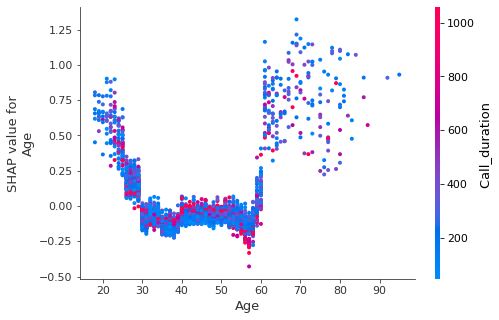

In [78]:
shap.dependence_plot("Age", shap_values, X)